In [1]:
import torch
import torch.nn as nn
from torchvision.models import densenet201, DenseNet201_Weights
from torchvision import transforms
from PIL import Image
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
import ast
import os

base_dir = '.'

MODEL_NAME = 'DENSENET201-Final'
PRETRAINED_MODEL = densenet201(weights=DenseNet201_Weights.DEFAULT)

threshold = 0.4
num_classes = 17
classes = ['airplane', 'bare-soil', 'buildings', 'cars', 'chaparral', 'court', 'dock', 'field', 'grass', 'mobile-home', 'pavement', 'sand', 'sea', 'ship', 'tanks', 'trees', 'water']

In [4]:
transform = transforms.Compose([
    transforms.Resize((256, 256)), # default
    transforms.RandomVerticalFlip(),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),  # !!!
])

# Define neural network architecture
class MultiClassifierModel(nn.Module):
    def __init__(self, num_classes):
        super(MultiClassifierModel, self).__init__()
        self.pretrained_model = PRETRAINED_MODEL
        self.fc = nn.Linear(1000, num_classes)  

    def forward(self, x):
        x = self.pretrained_model(x)
        x = self.fc(x)
        return x
    
# Define a function to preprocess the test image
def preprocess_test_image(image):
    image = transform(image)
    image = image.unsqueeze(0)  # Add a batch dimension
    return image

# Define a function to get predictions from the model
def get_predictions(model, image):
    with torch.no_grad():
        outputs = model(image)
        sigmoid = torch.nn.Sigmoid()
        predictions = sigmoid(outputs)  # Apply sigmoid to get probability scores
    return predictions

In [5]:
device = torch.device("mps:0" if torch.backends.mps.is_available() else "cuda:0" if torch.cuda.is_available() else "cpu")
device

# Load the model
model = MultiClassifierModel(num_classes).to(device)
model.load_state_dict(torch.load(f'{base_dir}/{MODEL_NAME}/MLC_16_3e-05_10.pth', map_location=device))

model.eval()  # Set the model to evaluation mode
device

device(type='mps', index=0)

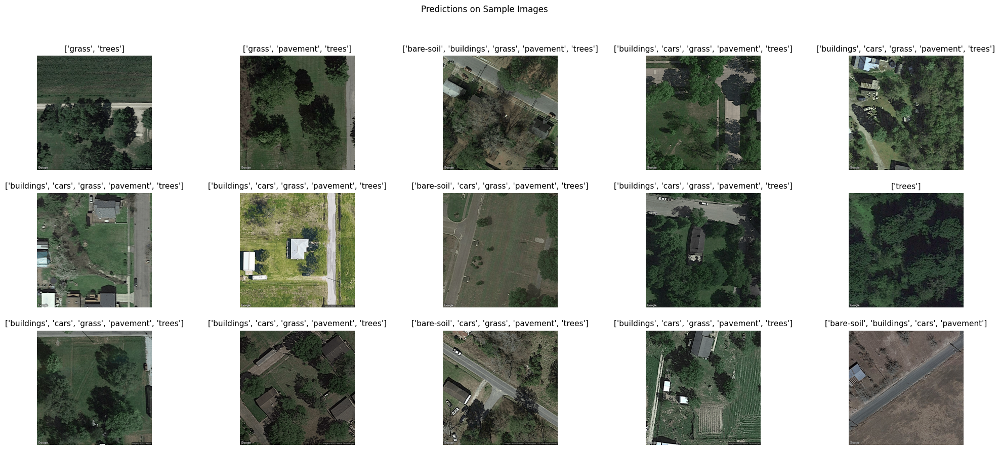

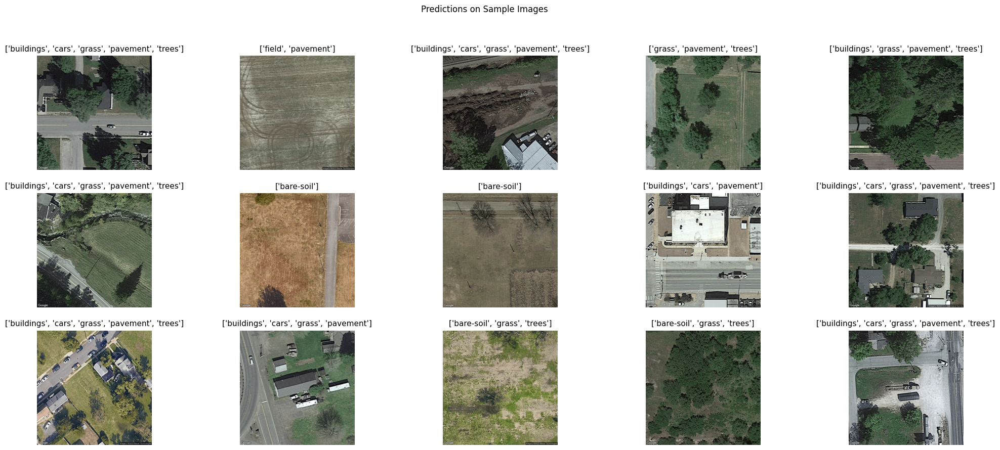

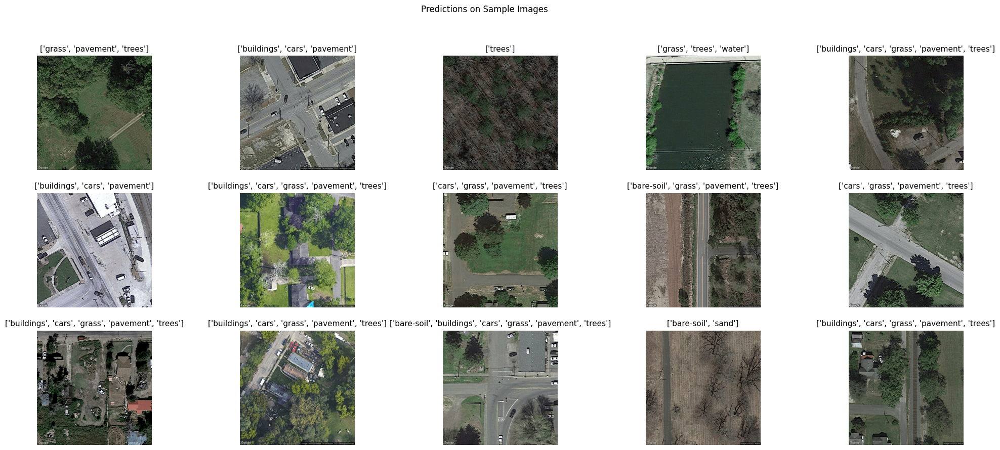

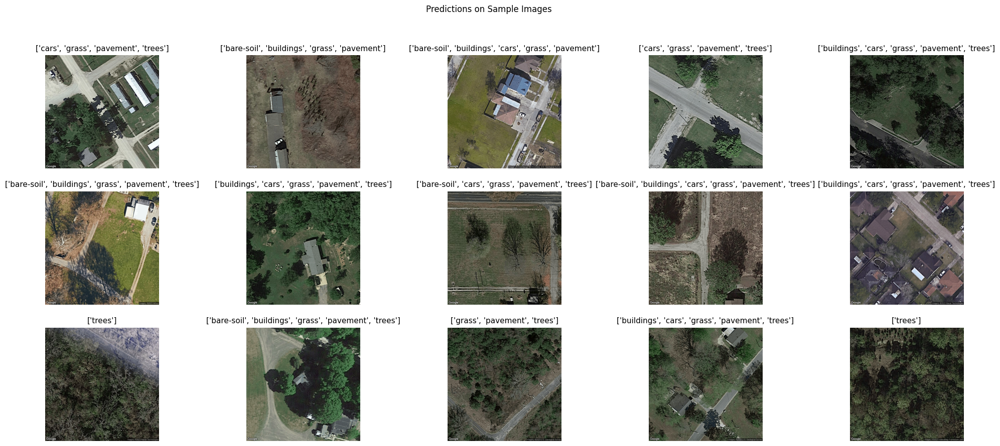

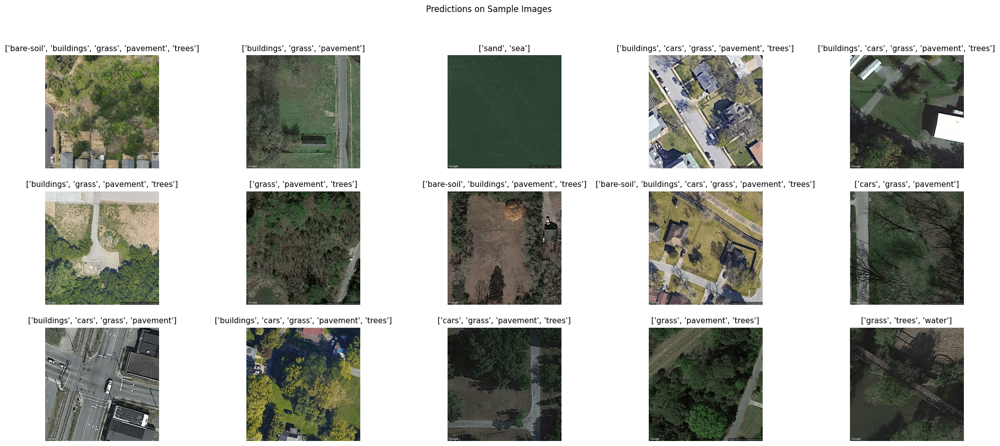

In [12]:
for j in range(5):
    row = 3
    col = 5
    fig, ax = plt.subplots(row, col, figsize=(25, 10))
    fig.suptitle("Predictions on Sample Images")


    for i in range(row*col):
        test_image = Image.open(f'../images_sat/{random.choice(os.listdir("../images_sat/"))}').convert('RGB')

        image = preprocess_test_image(test_image).to(device)
        predictions = get_predictions(model, image)
        pred_labels = [classes[j] for j in range(num_classes) if predictions[0][j] >= threshold]

        ax[i//col][i%col].imshow(test_image)
        ax[i//col][i%col].axis('off')
        ax[i//col][i%col].set_title(pred_labels, fontsize=11)

    plt.savefig(f'RESULTS/predictions-{j}.png', bbox_inches='tight')
    plt.show()

In [5]:
# Specify the directory containing test images
test_image_dir = '../images_sat'

# Initialize empty lists to store results
image_paths = []
image_predictions = []
predicted_classes = []
confidences = []

# Process each image in the directory
for image_filename in tqdm(os.listdir(test_image_dir)):
    if '.png' not in image_filename:
        continue
    image_path = os.path.join(test_image_dir, image_filename)
    image = Image.open(image_path).convert('RGB')
    image = preprocess_test_image(image).to(device)
    predictions = get_predictions(model, image).squeeze().cpu().numpy()
    
    # Find classes with confidence above the threshold
    selected_classes = [classes[i] for i in range(num_classes) if predictions[i] > threshold]
    selected_confidences = [predictions[i] for i in range(num_classes) if predictions[i] > threshold]
    
    image_paths.append(image_path)
    image_predictions.append(predictions)
    predicted_classes.append(selected_classes)
    confidences.append(selected_confidences)

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Image Path': image_paths,
    'Predicted Classes': predicted_classes,
    'Confidences': confidences
})

# Save the results to a CSV file
results_df.to_csv('image_results.csv', index=False)

100%|██████████| 40052/40052 [1:07:29<00:00,  9.89it/s]


In [2]:
# Load the results from the CSV file
df = pd.read_csv('RESULTS/image_results.csv')

df['Predicted Classes'] = df['Predicted Classes'].apply(lambda x: ast.literal_eval(x))
df['Confidences'] = df['Confidences'].apply(lambda x: ast.literal_eval(x))
df['all'] = [[] for _ in range(len(df))]

for i in range(num_classes):
    df[f'{classes[i]}'] = df['Predicted Classes'].apply(lambda x: 1 if classes[i] in x else 0)

for i in range(len(df)):   
    df.at[i, 'all'] = df.iloc[i, 4:].values.tolist()

df

,Image Path,Predicted Classes,Confidences,all,airplane,bare-soil,buildings,cars,chaparral,court,...,field,grass,mobile-home,pavement,sand,sea,ship,tanks,trees,water
0,../images_sat/20037.png,"[buildings, cars, grass, pavement, trees]","[0.9512636, 0.9970114, 0.888372, 0.9789242, 0....","[0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,1,0,0,...,0,1,0,1,0,0,0,0,1,0
1,../images_sat/3975.png,"[buildings, cars, grass, pavement, trees]","[0.8327008, 0.8837743, 0.99974436, 0.99994814,...","[0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,1,0,0,...,0,1,0,1,0,0,0,0,1,0
2,../images_sat/38678.png,"[buildings, grass, pavement, trees]","[0.5065095, 0.84604937, 0.8208974, 0.9969427]","[0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0
3,../images_sat/30224.png,"[grass, pavement, trees]","[0.9480307, 0.5640466, 0.99995327]","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
4,../images_sat/27758.png,"[buildings, grass, pavement, trees]","[0.99853516, 0.9982091, 0.7183395, 0.9999547]","[0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40047,../images_sat/37552.png,"[buildings, grass, pavement, trees]","[0.4663876, 0.9692197, 0.88713646, 0.9799697]","[0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0
40048,../images_sat/28472.png,"[buildings, cars, grass, pavement, trees]","[0.7099825, 0.93351126, 0.9997476, 0.98924273,...","[0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,1,0,0,...,0,1,0,1,0,0,0,0,1,0
40049,../images_sat/27741.png,"[buildings, cars, grass, pavement, trees]","[0.5407101, 0.47761345, 0.531781, 0.7748062, 0...","[0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,1,0,0,...,0,1,0,1,0,0,0,0,1,0
40050,../images_sat/36894.png,"[buildings, cars, grass, pavement, trees]","[0.97285503, 0.9974739, 0.9999664, 0.99969137,...","[0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, ...",0,0,1,1,0,0,...,0,1,0,1,0,0,0,0,1,0


/Users/hotal/Desktop/MapHarvester/venv/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hotal/Desktop/MapHarvester/venv/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hotal/Desktop/MapHarvester/venv/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


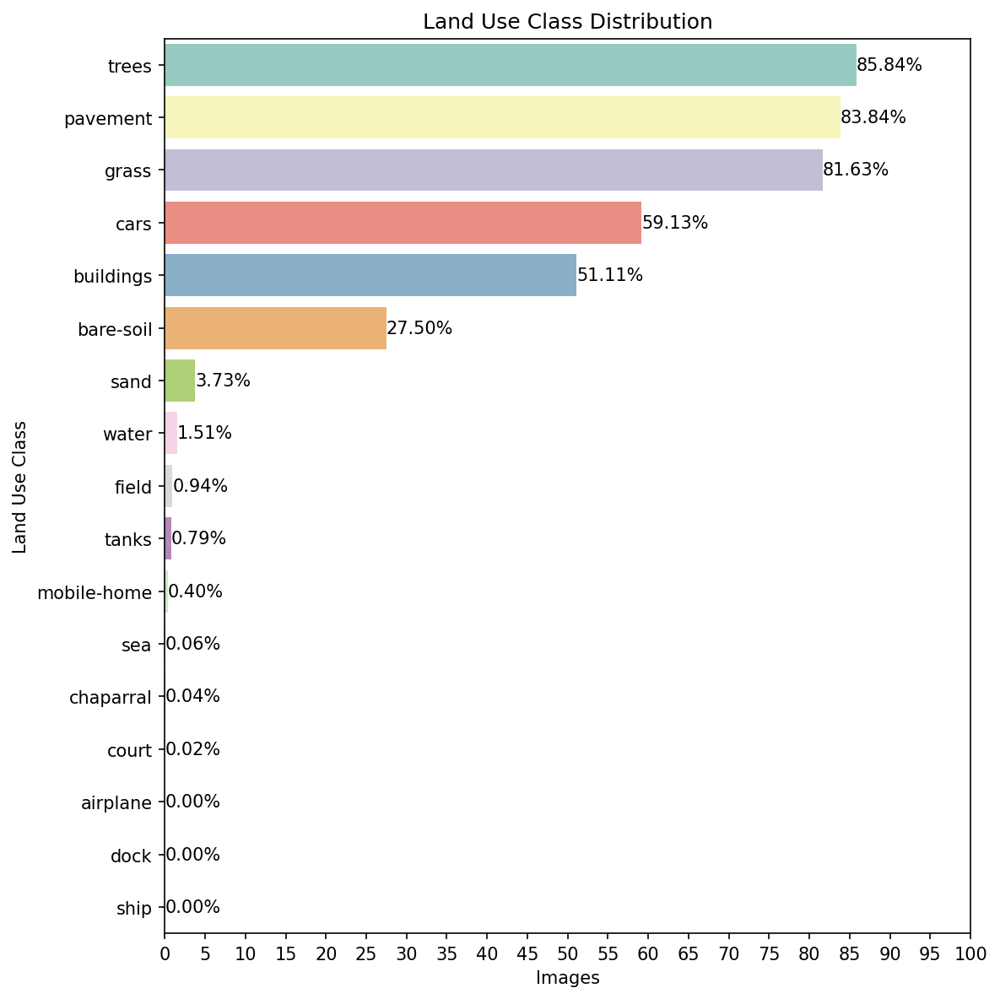

In [21]:
image_predictions = np.array(df['all'].values.tolist())

# Calculate the number of images for each class
class_counts = 100 * np.array(image_predictions).sum(axis=0) / len(image_predictions)
class_counts

plt.figure(figsize=(8, 8), dpi=150)

sorted_idx = np.argsort(class_counts)[::-1]
sorted_class_counts = class_counts[sorted_idx]
sorted_classes = np.array(classes)[sorted_idx]

ax = sns.barplot(x=sorted_class_counts, y=sorted_classes, palette='Set3')

for i in ax.containers:
    ax.bar_label(i, fmt='%.2f%%', label_type='edge')

plt.title('Land Use Class Distribution')
plt.xlabel('Images')
plt.xticks(np.arange(0, 101, 5))
plt.ylabel('Land Use Class')
plt.savefig('RESULTS/satellite_images_usage.png', bbox_inches='tight')
plt.tight_layout()
plt.show()

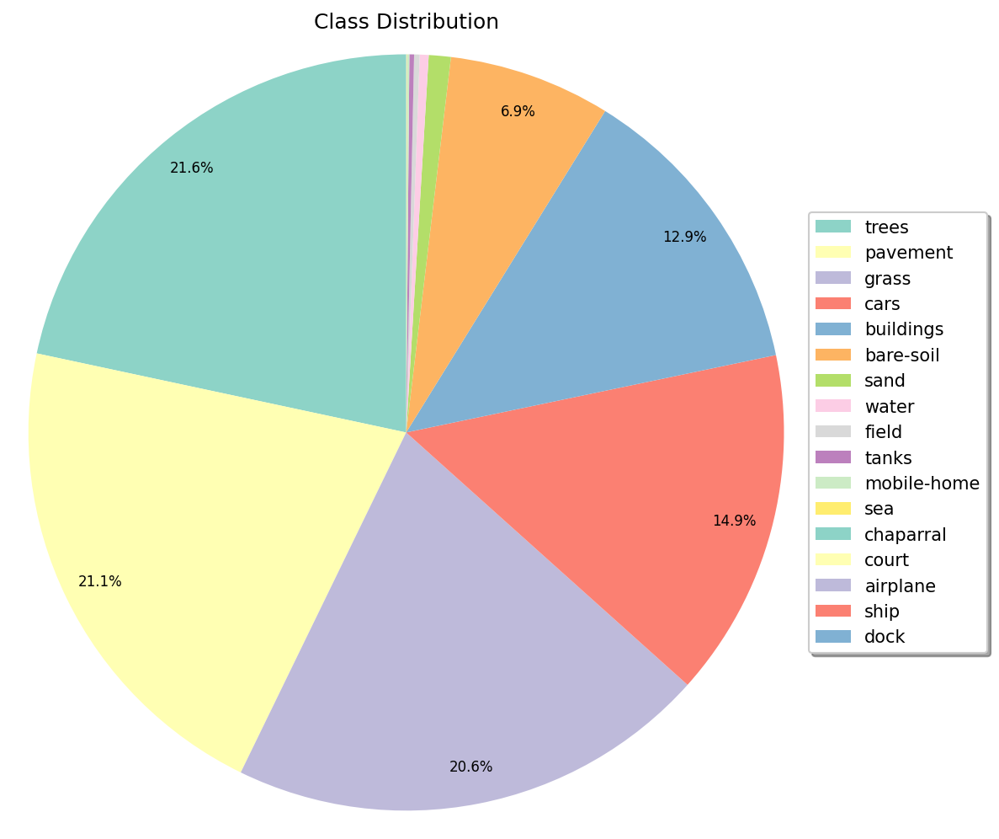

In [46]:
image_predictions = np.array(df['all'].values.tolist())

# Calculate the number of images for each class
class_counts = np.array(image_predictions).sum(axis=0)

# Sort class_counts and classes based on class_counts
sorted_class_counts, sorted_classes = zip(*sorted(zip(class_counts, classes), reverse=True))

def format_percent(pct):
    if pct < 1:
        return ''
    return f'{pct:.1f}%'

# Plot a pie chart of class distribution
plt.figure(figsize=(8, 8), dpi=150)
plt.pie(
    sorted_class_counts, 
    autopct=format_percent, 
    startangle=90, 
    textprops={'fontsize': 8},
    colors=sns.color_palette('Set3'),
    pctdistance=0.9,
    radius=1.2
)
plt.title('Class Distribution')
plt.legend(sorted_classes, loc='center left', ncol=1, fancybox=True, shadow=True, bbox_to_anchor=(1, 0.5))
plt.tight_layout()

# plt.savefig(f'{base_dir}/class_dist.png', bbox_inches='tight')

plt.show()

/Users/hotal/Desktop/MapHarvester/venv/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hotal/Desktop/MapHarvester/venv/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hotal/Desktop/MapHarvester/venv/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


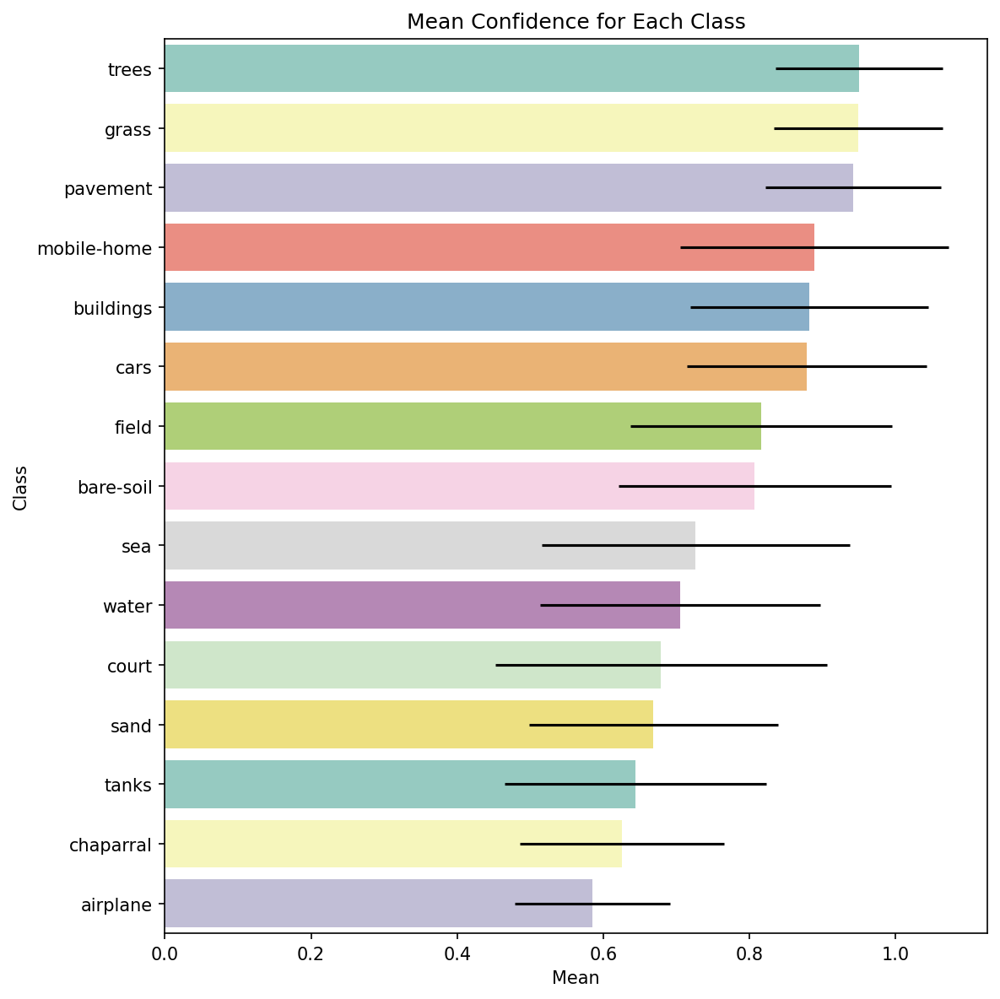

In [7]:


# Initialize a dictionary to store class-wise confidence means
class_confidence_means = {}

# Calculate mean confidence for each class
for _, row in df.iterrows():
    predicted_classes = row['Predicted Classes']
    confidences = row['Confidences']
    for i, class_name in enumerate(predicted_classes):
        if class_name not in class_confidence_means:
            class_confidence_means[class_name] = []
        class_confidence_means[class_name].append(confidences[i])

# Calculate the mean for each class
class_df = pd.DataFrame.from_dict( {
    'Class': list(class_confidence_means.keys()),
    'Mean': [np.mean(class_confidence_means[class_name]) for class_name in class_confidence_means],
    'Std': [np.std(class_confidence_means[class_name]) for class_name in class_confidence_means]
})

# Sort the DataFrame based on mean confidence
class_df = class_df.sort_values('Mean', ascending=False)

# Plot a bar chart of mean confidence for each class
plt.figure(figsize=(8, 8), dpi=150)
sns.barplot(x='Mean', y='Class', data=class_df, palette='Set3', xerr=class_df['Std'])
plt.title('Mean Confidence for Each Class')
plt.tight_layout()

plt.savefig(f'{base_dir}/mean_confidence.png', bbox_inches='tight')

plt.show()